# DS 5001 Exploratory Text Analytics Final Project
## Various Analyses of Sports Articles
### Nicholas Cagliuso (nph4zk@virginia.edu)
#### May 6, 2024
##### Dataset Source: https://archive.ics.uci.edu/dataset/450/sports+articles+for+objectivity+analysis

The data used for this text analysis is a set of 1,000 online sports articles published between 2010 and 2013, originally compiled for objectivity analysis and shared as part of the open-source UC Irvine Machine Learning Repository.

## Setup: Importing Packages and Setting Directory

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import re 
from glob import glob
import seaborn as sns
import nltk
import plotly_express as px
from numpy.linalg import norm
from scipy.spatial.distance import pdist
#from tqdm import tqdm
from nltk.corpus import stopwords 
from nltk.stem.porter import PorterStemmer
from sklearn.decomposition import PCA
from scipy.linalg import eigh as eig
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA
import sqlite3
#from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import normalize
import scipy.cluster.hierarchy as sch
from gensim.models import word2vec
from sklearn.manifold import TSNE
from IPython.core.display import display, HTML
import warnings 
import tldextract
from urllib.parse import urlparse

sns.set(style='ticks')
%matplotlib inline
warnings.simplefilter(action = 'ignore', category = FutureWarning)

C:\Users\nvcjr\AppData\Roaming\Python\Python39\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


The packages above are compiled from across the provided Module Notebooks from this course. The subsections below specify from which notebooks code was adapted to apply to this specific corpus of texts.

In [2]:
OHCO = ['article_id', 'para_num', 'sent_num', 'token_num']

os.chdir('/Users/nvcjr/Virginia/DS5001/Final Project/Project Texts')
directory = 'Raw data'

features = pd.read_csv('features.csv')
features = features.rename(columns = {'TextID': 'article_id'})

## Creating Core Tables (POS Tagging, Recognizing Stopwords, Stemming)
#### Code adapted from Module 4 Notebook.

In [3]:
def acquire_articles(article_list, OHCO=OHCO):
    
    my_lib = []
    my_doc = []

    for file in article_list:
        
        article_id = str(file.split('\\')[-1].split('.')[0])
        
        lines = open(file, 'r', encoding='utf-8-sig').readlines()
        df = pd.DataFrame(lines, columns=['line_str'])
        df.index.name = 'line_num'
        df.line_str = df.line_str.str.strip()
        df['article_id'] = article_id
        
        df.line_str = df.line_str.str.replace('—', ' — ')
        df.line_str = df.line_str.str.replace('-', ' - ')
        
        df = df.groupby(OHCO[:1]).line_str.apply(lambda x: '\n'.join(x)).to_frame()
        
        df = df['line_str'].str.split(r'\n\n+', expand=True).stack().to_frame().rename(columns={0:'para_str'})
        df.index.names = OHCO[:2] # MAY NOT BE NECESSARY UNTIL THE END
        df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()
        df = df[~df['para_str'].str.match(r'^\s*$')] # Remove empty paragraphs
        
        df.reset_index().set_index(OHCO[:2])

        my_lib.append((article_id, file))
        my_doc.append(df)

    docs = pd.concat(my_doc)
    library = pd.DataFrame(my_lib, columns=['article_id', 'article_file']).set_index('article_id')
    return library, docs

In [4]:
articles = [article for article in sorted(glob(directory+'/*.txt'))]
LIB, DOC = acquire_articles(articles)

In [5]:
LIB = LIB.merge(features, how = 'inner', on = 'article_id')
#https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.merge.html

In [6]:
LIB = LIB[['article_id', 'URL','article_file']]
LIB = LIB.set_index('article_id')
LIB['website'] = LIB['URL'].apply(lambda URL: urlparse(URL).netloc)
#https://stackoverflow.com/a/72036375
LIB.head(10)

,URL,article_file,website
article_id,,,
Text0001,http://msn.foxsports.com/foxsoccer/mexico/stor...,Raw data\Text0001.txt,msn.foxsports.com
Text0002,http://msn.foxsports.com/foxsoccer/premierleag...,Raw data\Text0002.txt,msn.foxsports.com
Text0003,http://uk.eurosport.yahoo.com/04022011/58/fed-...,Raw data\Text0003.txt,uk.eurosport.yahoo.com
Text0004,http://uk.eurosport.yahoo.com/07022011/58/bund...,Raw data\Text0004.txt,uk.eurosport.yahoo.com
Text0005,http://uk.eurosport.yahoo.com/05022011/58/fed-...,Raw data\Text0005.txt,uk.eurosport.yahoo.com
Text0006,http://msn.foxsports.com/nba/story/julius-ervi...,Raw data\Text0006.txt,msn.foxsports.com
Text0007,http://uk.eurosport.yahoo.com/07022011/58/spai...,Raw data\Text0007.txt,uk.eurosport.yahoo.com
Text0008,http://msn.foxsports.com/collegebasketball/sto...,Raw data\Text0008.txt,msn.foxsports.com
Text0009,http://msn.foxsports.com/collegebasketball/sto...,Raw data\Text0009.txt,msn.foxsports.com


In [7]:
WEB_FREQ = pd.DataFrame(LIB['website'].value_counts())
WEB_FREQ

,website
msn.foxsports.com,497
www.nba.com,70
uk.eurosport.yahoo.com,63
www.dailystar.co.uk,59
www.football365.com,42
...,...
www.chicagotribune.com,1
www.foxsports.com.au,1
www.herald.ie,1
www.thesun.co.uk,1


One immediate limitation of this dataset is that metadata on which to analyze the text is very limited; the original dataset only featured the URL of each article, and I manually extracted the specific website on which each article was published above. In addition, there is a notable disparity in the distribution of host websites across the corpus. As can be seen directly above, only one website is home to nearly half of this corpus's articles, despite their being 84 websites represented in total. As such, and perhaps unsurprisingly, no other website is featured even fifteen percent as frequently in the corpus as "msn.foxsports.com"

In [8]:
DOC

para_str
article_id para_num                                                   
Text0001   0         Finalists in the Apertura play - offs, Toluca ...
Text0002   0         City manager Roberto Mancini has consistently ...
           1         In terms of fitness, Balotelli missed Saturday...
Text0003   0         Doubles duo Heather Watson and Jocelyn Ray sav...
           1         The pair secured Britain's place in Europe/Afr...
...                                                                ...
Text1000   6         In my opinion, the 1980s was the greatest deca...
           7         I don’t see how any decade will ever compare w...
           8         If anybody wants to quarrel with the fact they...
           9         So Friday night’s ceremony to retire Dennis Ro...
           10        Chuck Daly was like a father to Dennis. He car...

[6235 rows x 1 columns]

In [9]:
def tokenize(doc_df, OHCO=OHCO, remove_pos_tuple=False, ws=False):
    
    df = doc_df.para_str\
        .apply(lambda x: pd.Series(nltk.sent_tokenize(x)))\
        .stack()\
        .to_frame()\
        .rename(columns={0:'sent_str'})
    
    def word_tokenize(x):
        if ws:
            s = pd.Series(nltk.pos_tag(nltk.WhitespaceTokenizer().tokenize(x)))
        else:
            s = pd.Series(nltk.pos_tag(nltk.word_tokenize(x)))
        return s
            
    df = df.sent_str\
        .apply(word_tokenize)\
        .stack()\
        .to_frame()\
        .rename(columns={0:'pos_tuple'})
    
    df['pos'] = df.pos_tuple.apply(lambda x: x[1])
    df['token_str'] = df.pos_tuple.apply(lambda x: x[0])
    if remove_pos_tuple:
        df = df.drop('pos_tuple', 1)
    
    df.index.names = OHCO
    
    return df

In [10]:
TOKEN = tokenize(DOC, ws=True)
TOKEN

pos_tuple  pos  token_str
article_id para_num sent_num token_num                                  
Text0001   0        0        0          (Finalists, NNS)  NNS  Finalists
                             1                  (in, IN)   IN         in
                             2                 (the, DT)   DT        the
                             3           (Apertura, NNP)  NNP   Apertura
                             4                (play, NN)   NN       play
...                                                  ...  ...        ...
Text1000   10       4        16                (the, DT)   DT        the
                             17           (building, NN)   NN   building
                             18                 (on, IN)   IN         on
                             19            (Friday, NNP)  NNP     Friday
                             20             (night., NN)   NN     night.

[702658 rows x 3 columns]

In [11]:
TOKEN = TOKEN.reset_index().merge(LIB['website'], on = 'article_id', how="left").set_index(TOKEN.index.names)
#https://stackoverflow.com/a/11982843
TOKEN

pos_tuple  pos  token_str  \
article_id para_num sent_num token_num                                     
Text0001   0        0        0          (Finalists, NNS)  NNS  Finalists   
                             1                  (in, IN)   IN         in   
                             2                 (the, DT)   DT        the   
                             3           (Apertura, NNP)  NNP   Apertura   
                             4                (play, NN)   NN       play   
...                                                  ...  ...        ...   
Text1000   10       4        16                (the, DT)   DT        the   
                             17           (building, NN)   NN   building   
                             18                 (on, IN)   IN         on   
                             19            (Friday, NNP)  NNP     Friday   
                             20             (night., NN)   NN     night.   

                                                  website  
article_id para_num sent_num token_num                     
Text0001   0        0        0          msn.foxsports.com  
                             1          msn.foxsports.com  
                             2          msn.foxsports.com  
                             3          msn.foxsports.com  
                             4          msn.foxsports.com  
...                                                   ...  
Text1000   10       4        16               www.nba.com  
                             17               www.nba.com  
                             18               www.nba.com  
                             19               www.nba.com  
                             20               www.nba.com  

[702658 rows x 4 columns]

In [12]:
TOKEN['term_str'] = TOKEN['token_str'].str.lower().str.replace('[\W_]', '')

In [13]:
VOCAB = TOKEN.term_str.value_counts().to_frame().rename(columns={'index':'term_str', 'term_str':'n'})\
    .sort_index().reset_index().rename(columns={'index':'term_str'})
VOCAB.index.name = 'term_id'

In [14]:
VOCAB['num'] = VOCAB.term_str.str.match("\d+").astype('int')
VOCAB

,term_str,n,num
term_id,,,
0,,15063,0
1,0,371,1
2,0007,1,1
3,0007s,1,1
4,0007sec,1,1
...,...,...,...
27491,ﬁnally,1,0
27492,ﬁnd,1,0
27493,ﬁne,1,0


In [15]:
VOCAB = VOCAB.drop(0)

In [16]:
sw = pd.DataFrame(nltk.corpus.stopwords.words('english'), columns=['term_str'])
sw = sw.reset_index().set_index('term_str')
sw.columns = ['dummy']
sw.dummy = 1
sw.sample(10)

,dummy
term_str,
until,1
out,1
wasn,1
haven't,1
how,1
these,1
won,1
are,1
d,1


In [17]:
VOCAB['stop'] = VOCAB.term_str.map(sw.dummy)
VOCAB['stop'] = VOCAB['stop'].fillna(0).astype('int')
VOCAB[VOCAB.stop == 1].sample(10)

,term_str,n,num,stop
term_id,,,,
4074,both,493,0,1
2499,are,2137,0,1
17398,of,12958,0,1
6869,d,71,0,1
4610,by,2028,0,1
16695,myself,77,0,1
11946,hers,2,0,1
24642,these,345,0,1
24614,them,935,0,1


In [18]:
stemmer = PorterStemmer()
VOCAB['p_stem'] = VOCAB.term_str.apply(stemmer.stem)
VOCAB.sample(10)

,term_str,n,num,stop,p_stem
term_id,,,,,
8471,edward,2,0,0,edward
14848,liriano,4,0,0,liriano
12566,illustrateds,1,0,0,illustr
13398,jams,2,0,0,jam
9656,feeble,3,0,0,feebl
3943,bogeys,2,0,0,bogey
10165,footing,4,0,0,foot
8327,dwarfs,2,0,0,dwarf
3903,boardroom,2,0,0,boardroom


## Creating Document-Term Matrix and Calculating Frequency Metrics
#### Code adapted from Module 5 Notebook.

In [19]:
count_method = 'n' 
tf_method = 'sum' 
tf_norm_k = .5 
idf_method = 'standard' 
gradient_cmap = 'GnBu' 

Each of the variables above for TF and IDF measuring were chosen simply because they were successfully implemented in both the Module 5 Notebook and Module 5 Code Exercise. As seen, below, however, either count method and any TF and IDF method may be easily applied for analysis of this corpus.

In [20]:
VOCAB = VOCAB.dropna()
TOKEN = TOKEN.dropna()

In [21]:
TOKEN['term_id'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)
TOKEN['term_id'] = TOKEN['term_id'].fillna(0).astype('int')
TOKEN.head()

pos_tuple  pos  token_str  \
article_id para_num sent_num token_num                                     
Text0001   0        0        0          (Finalists, NNS)  NNS  Finalists   
                             1                  (in, IN)   IN         in   
                             2                 (the, DT)   DT        the   
                             3           (Apertura, NNP)  NNP   Apertura   
                             4                (play, NN)   NN       play   

                                                  website   term_str  term_id  
article_id para_num sent_num token_num                                         
Text0001   0        0        0          msn.foxsports.com  finalists     9844  
                             1          msn.foxsports.com         in    12689  
                             2          msn.foxsports.com        the    24599  
                             3          msn.foxsports.com   apertura     2380  
                             4          msn.foxsports.com       play    18731

### Exploratory Data Analysis

In [22]:
VOCAB['pos_max'] = TOKEN.groupby(['term_id', 'pos']).count().iloc[:,0].unstack().idxmax(1)
VOCAB.head()

,term_str,n,num,stop,p_stem,pos_max
term_id,,,,,,
1,0,371,1,0,0,CD
2,0007,1,1,0,0007,CD
3,0007s,1,1,0,0007,CD
4,0007sec,1,1,0,0007sec,CD
5,00221,1,1,0,00221,CD


In [23]:
POS = TOKEN.pos.value_counts().to_frame().rename(columns={'pos':'n'})
POS.index.name = 'pos_id'

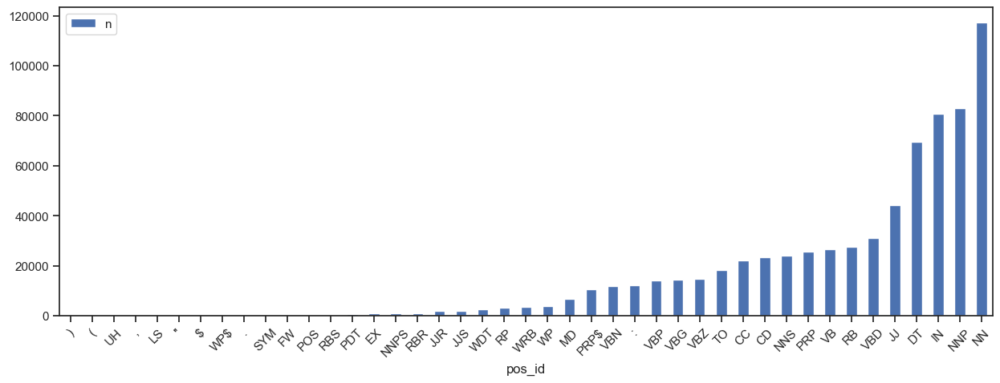

In [24]:
POS.sort_values('n').plot.bar(y='n', figsize=(15,5), rot=45);

In [25]:
POS_MAX = VOCAB.pos_max.value_counts().to_frame().rename(columns={'pos_max':'n'})
POS_MAX.index.name = 'pos_id'

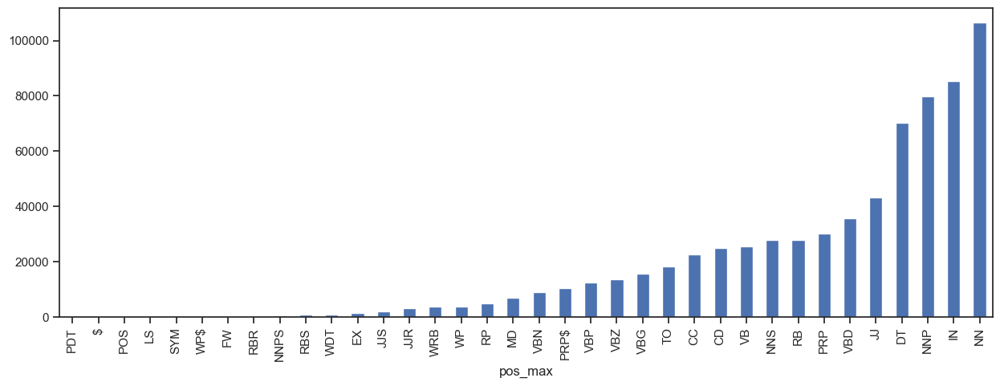

In [26]:
VOCAB.groupby('pos_max').n.sum().sort_values().plot.bar(figsize=(15,5));

As one may expect, the two plots above indicate that the most frequent words used across the corpus of articles are nouns (including proper nouns) and prepositions or subordinating conjunctions such as "in," "of," and "if" (https://www.sjsu.edu/writingcenter/docs/handouts/Subordinating%20Conjunctions.pdf). These two visualizations are a good "sanity check" for the data following the creation of the core tables used for the actual analysis carried out below.

In [27]:
if 'term_rank' not in VOCAB.columns:
    VOCAB = VOCAB.sort_values('n', ascending=False).reset_index()
    VOCAB.index.name = 'term_rank'
    VOCAB = VOCAB.reset_index()
    VOCAB = VOCAB.set_index('term_id')
    VOCAB['term_rank'] = VOCAB['term_rank'] + 1

In [28]:
VOCAB.head()

,term_rank,term_str,n,num,stop,p_stem,pos_max
term_id,,,,,,,
24599,1,the,39434,0,1,the,DT
24894,2,to,18422,0,1,to,TO
1401,3,a,17477,0,1,a,DT
2223,4,and,17076,0,1,and,CC
12689,5,in,14013,0,1,in,IN


In [29]:
new_rank = VOCAB.n.value_counts()\
    .sort_index(ascending=False).reset_index().reset_index()\
    .rename(columns={'level_0':'term_rank2', 'index':'n', 'n':'nn'})\
    .set_index('n')
VOCAB['term_rank2'] = VOCAB.n.map(new_rank.term_rank2) + 1

In [30]:
VOCAB.head()

,term_rank,term_str,n,num,stop,p_stem,pos_max,term_rank2
term_id,,,,,,,,
24599,1,the,39434,0,1,the,DT,1
24894,2,to,18422,0,1,to,TO,2
1401,3,a,17477,0,1,a,DT,3
2223,4,and,17076,0,1,and,CC,4
12689,5,in,14013,0,1,in,IN,5


In [31]:
VOCAB['p'] = VOCAB.n / TOKEN.shape[0]
VOCAB['zipf_k'] = VOCAB.n * VOCAB.term_rank
VOCAB['zipf_k2'] = VOCAB.n * VOCAB.term_rank2
VOCAB['zipf_k3'] = VOCAB.p * VOCAB.term_rank2

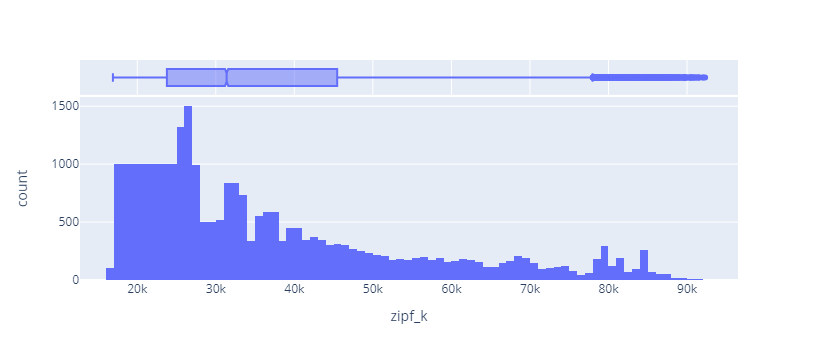

In [32]:
px.histogram(VOCAB, 'zipf_k', marginal='box')

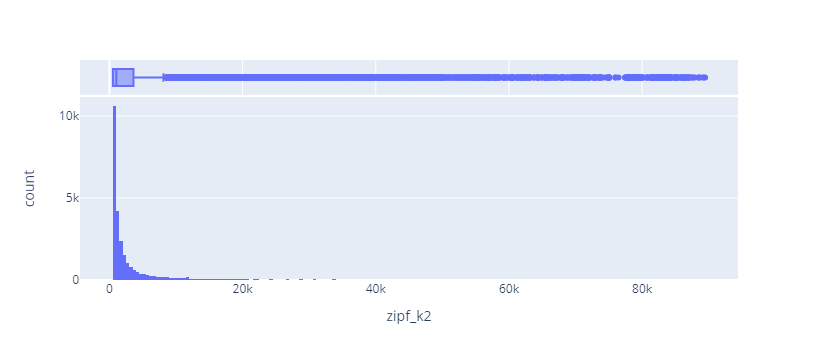

In [33]:
px.histogram(VOCAB, 'zipf_k2', marginal='box')

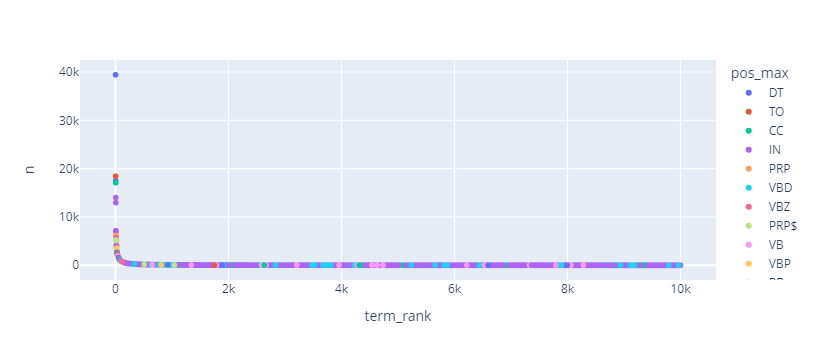

In [34]:
px.scatter(VOCAB[VOCAB.term_rank <= 10000], x='term_rank', y='n', log_y=False, log_x=False, hover_name='term_str', color='pos_max')

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


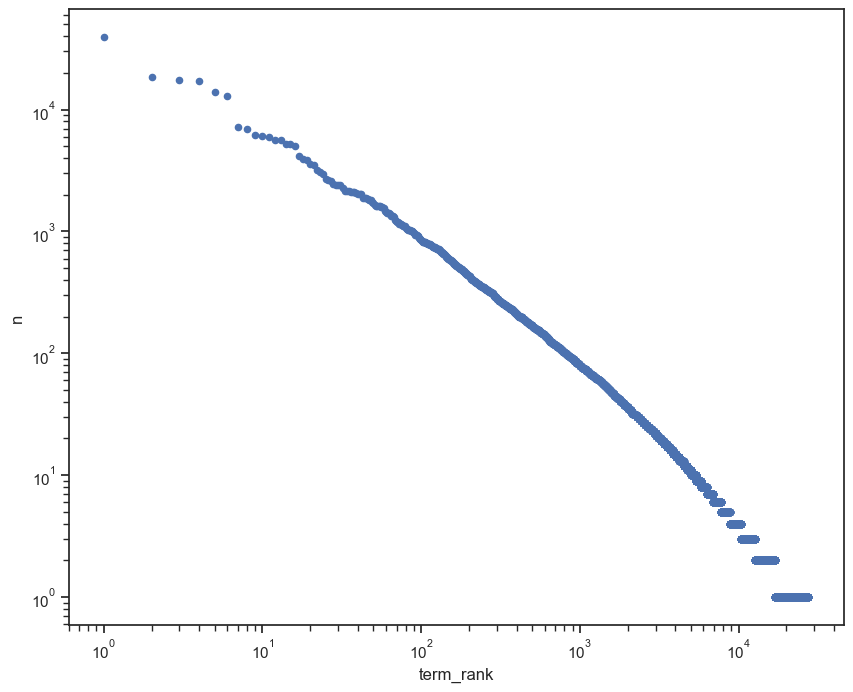

In [35]:
VOCAB.plot.scatter('term_rank', 'n', figsize=(10,8), logx=True, logy=True);

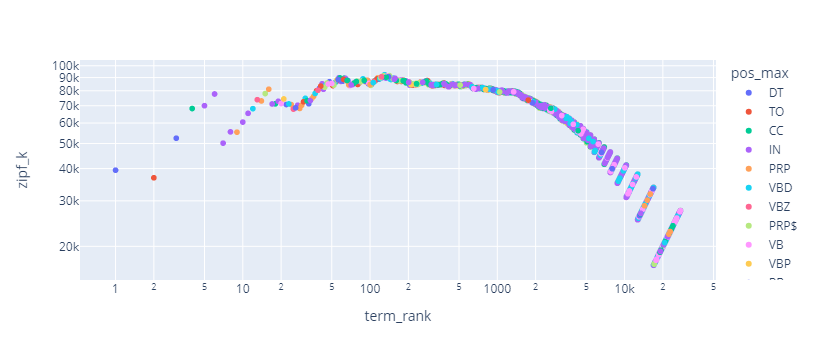

In [36]:
px.scatter(VOCAB, x='term_rank', y='zipf_k', hover_name='term_str', hover_data=['n'], log_y=True, log_x=True, color='pos_max')

In [37]:
rank_index = [1, 2, 3, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000]

In [38]:
term_info = VOCAB.loc[VOCAB.term_rank.isin(rank_index), ['term_str', 'term_rank', 'n', 'zipf_k', 'pos_max']]

In [39]:
term_info.style.background_gradient(cmap=gradient_cmap, high=.5)

,term_str,term_rank,n,zipf_k,pos_max
term_id,,,,,
24599,the,1,39434,39434,DT
24894,to,2,18422,36844,TO
1401,a,3,17477,52431,DT
17514,on,10,6053,60530,IN
3327,be,20,3571,71420,VB
10626,game,30,2418,72540,NN
2022,all,40,2044,81760,DT
25917,up,50,1709,85450,RP
22776,so,60,1457,87420,RB


Each of the visualizations above following the part-of-speech frequency bar charts serve as another "sanity check" for our data; that is, Zipf's law appears to be largely adhered to by our corpus of tokens. Generally speaking, each term's frequency relative to the most frequent term in the corpus is inversely proportional to its rank. For example, as the table above shows, the term "to" with term rank "2" appears approximately one-half (1/2) as frequently as "the," the most frequent term in the corpus.

### Document-Term Matrix and Frequency Metrics

In [40]:
BOW = TOKEN.groupby(OHCO[:1]+['term_id']).term_id.count().to_frame().rename(columns={'term_id':'n'})

The bag-of-words is grouped by article (`groupby(OHCO[:1]+['term_id'])`) because a substantial share of the articles in this corpus are short-form. That is, there is often little distinction between an entire article or a single paragraph within this selection of texts. For example, some articles are simple summaries of a recently played game which includes key players and events from the matchup. In fact, a good example of this is the very first article, with file name "Text0001.txt" in the "Raw data" folder provided with this submission. 

In [41]:
BOW['c'] = BOW.n.astype('bool').astype('int')
BOW.head()

n  c
article_id term_id      
Text0001   0        2  1
           43       2  1
           184      1  1
           217      2  1
           313      1  1

In [42]:
DTCM = BOW[count_method].unstack().fillna(0).astype('int')
DTCM.head(10)

term_id,0,1,2,3,4,5,6,7,8,9,...,27486,27487,27488,27489,27490,27491,27492,27493,27494,27495
article_id,,,,,,,,,,,,,,,,,,,,,
Text0001,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Text0002,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Text0003,8,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Text0004,8,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Text0005,35,4,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Text0006,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Text0007,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Text0008,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Text0009,25,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [43]:
print('TF method:', tf_method)
if tf_method == 'sum':
    TF = DTCM.T / DTCM.T.sum()
elif tf_method == 'max':
    TF = DTCM.T / DTCM.T.max()
elif tf_method == 'log':
    TF = np.log10(1 + DTCM.T)
elif tf_method == 'raw':
    TF = DTCM.T
elif tf_method == 'double_norm':
    TF = DTCM.T / DTCM.T.max()
    TF = tf_norm_k + (1 - tf_norm_k) * TF[TF > 0]
elif tf_method == 'binary':
    TF = DTCM.T.astype('bool').astype('int')
TF = TF.T

TF method: sum


In [44]:
TF.head(10)

term_id,0,1,2,3,4,5,6,7,8,9,...,27486,27487,27488,27489,27490,27491,27492,27493,27494,27495
article_id,,,,,,,,,,,,,,,,,,,,,
Text0001,0.020202,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0002,0.018779,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0003,0.052288,0.013072,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0004,0.025157,0.003145,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0005,0.061947,0.007080,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0006,0.019337,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0007,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0008,0.006048,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0009,0.028441,0.001138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [45]:
DF = DTCM[DTCM > 0].count()
DF.head()

term_id
0    983
1    173
2      1
3      1
4      1
dtype: int64

In [46]:
N = DTCM.shape[0]

In [47]:
print('IDF method:', idf_method)
if idf_method == 'standard':
    IDF = np.log10(N / DF)
elif idf_method == 'max':
    IDF = np.log10(DF.max() / DF) 
elif idf_method == 'smooth':
    IDF = np.log10((1 + N) / (1 + DF)) + 1

IDF method: standard


In [48]:
TFIDF = TF * IDF
TFIDF.head()

term_id,0,1,2,3,4,5,6,7,8,9,...,27486,27487,27488,27489,27490,27491,27492,27493,27494,27495
article_id,,,,,,,,,,,,,,,,,,,,,
Text0001,0.000150,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0002,0.000140,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0003,0.000389,0.009960,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0004,0.000187,0.002396,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0005,0.000461,0.005394,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [49]:
VOCAB['df'] = DF
VOCAB['idf'] = IDF
VOCAB.head()

,term_rank,term_str,n,num,stop,p_stem,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,df,idf
term_id,,,,,,,,,,,,,,
24599,1,the,39434,0,1,the,DT,1,0.056121,39434,39434,0.056121,999,0.000435
24894,2,to,18422,0,1,to,TO,2,0.026218,36844,36844,0.052435,990,0.004365
1401,3,a,17477,0,1,a,DT,3,0.024873,52431,52431,0.074618,986,0.006123
2223,4,and,17076,0,1,and,CC,4,0.024302,68304,68304,0.097208,986,0.006123
12689,5,in,14013,0,1,in,IN,5,0.019943,70065,70065,0.099714,990,0.004365


In [50]:
BOW['tf'] = TF.stack()
BOW['tfidf'] = TFIDF.stack()
BOW

n  c        tf     tfidf
article_id term_id                          
Text0001   0        2  1  0.020202  0.000150
           43       2  1  0.020202  0.009648
           184      1  1  0.010101  0.007171
           217      2  1  0.020202  0.015598
           313      1  1  0.010101  0.019784
...                .. ..       ...       ...
Text1000   27096    1  1  0.001261  0.001050
           27118    1  1  0.001261  0.000748
           27156    1  1  0.001261  0.000381
           27309    1  1  0.001261  0.000417
           27353    9  1  0.011349  0.002788

[318738 rows x 4 columns]

In [51]:
VOCAB['tfidf_mean'] = TFIDF[TFIDF > 0].mean().fillna(0) 
VOCAB['tfidf_sum'] = TFIDF.sum()
VOCAB['tfidf_median'] = TFIDF[TFIDF > 0].median().fillna(0) 
VOCAB['tfidf_max'] = TFIDF.max()

In [52]:
VOCAB = VOCAB.drop_duplicates(subset = ['term_str'])
VOCAB.sort_values('tfidf_sum', ascending=False).head(50).style.background_gradient(cmap=gradient_cmap)

,term_rank,term_str,n,num,stop,p_stem,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,df,idf,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max
term_id,,,,,,,,,,,,,,,,,,
22103,83,she,1037,0,1,she,PRP,80,0.001476,86071,82960,0.118066,171,0.767004,0.007238,1.237644,0.005609,0.030025
11914,79,her,1104,0,1,her,PRP$,76,0.001571,87216,83904,0.119409,181,0.742321,0.006301,1.140432,0.005057,0.019773
12465,16,i,5071,0,1,i,PRP,16,0.007217,81136,81136,0.115470,698,0.156145,0.001531,1.068713,0.001111,0.008098
18834,75,points,1143,0,0,point,NNS,72,0.001627,85725,82296,0.117121,337,0.472370,0.002791,0.940713,0.001663,0.027252
26645,24,we,2948,0,1,we,PRP,24,0.004195,70752,70752,0.100692,614,0.211832,0.001496,0.918537,0.001048,0.009513
11761,9,he,6148,0,1,he,PRP,9,0.008750,55332,55332,0.078747,792,0.101275,0.001124,0.890009,0.000930,0.005139
21375,23,said,3094,0,0,said,VBD,23,0.004403,71162,71162,0.101275,697,0.156767,0.001079,0.752161,0.000921,0.005959
10626,30,game,2418,0,0,game,NN,30,0.003441,72540,72540,0.103237,583,0.234331,0.001234,0.719303,0.000996,0.005734
14507,77,league,1116,0,0,leagu,NN,74,0.001588,85932,82584,0.117531,421,0.375718,0.001677,0.706087,0.001089,0.015398


In [53]:
VOCAB[['term_rank','term_str','pos_max','tfidf_sum']].sort_values('tfidf_sum', ascending=False).head(50).style.background_gradient(cmap=gradient_cmap)

,term_rank,term_str,pos_max,tfidf_sum
term_id,,,,
22103,83,she,PRP,1.237644
11914,79,her,PRP$,1.140432
12465,16,i,PRP,1.068713
18834,75,points,NNS,0.940713
26645,24,we,PRP,0.918537
11761,9,he,PRP,0.890009
21375,23,said,VBD,0.752161
10626,30,game,NN,0.719303
14507,77,league,NN,0.706087


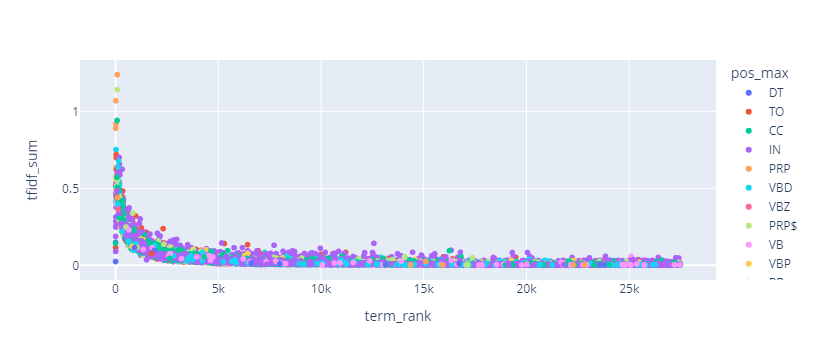

In [54]:
px.scatter(VOCAB, x='term_rank', y='tfidf_sum', hover_name='term_str', hover_data=['n'], color='pos_max', 
           log_x=False, log_y=False)

It appears that the TF-IDF values of terms within this corpus meet general expectations of falling between zero and one, which is to be expected given the previous exploratory data analysis conducted on this corpus. Furthermore, the scatter plot immediately above somewhat mirrors Luhn's 1958 "concept of significant words" (as discussed in Module 5, specifically slide 10 of the Presentation). However, these term ranks plotted against TF-IDF appear to be somewhat right-skewed, which could be due to the simple brevity of this dataset; as mentioned, it only contains 1,000 articles that are, at most, each a few paragraphs long (as opposed to a single novel or even a selection of novels, fore example).

In [55]:
TOKEN['tfidf_sum'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').tfidf_sum)
TOKEN['stop'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').stop)

In [56]:
DOC.to_csv('DOC.csv')
LIB.to_csv('LIB.csv')
TOKEN.to_csv('TOKEN.csv')
VOCAB.to_csv('VOCAB.csv')

## Principal Component Analysis
#### Code Adapted from Module 7 Notebook.

In [57]:
TOKEN = TOKEN[(TOKEN.stop == 0.0) & (TOKEN.tfidf_sum >= .005)]
TOKEN

pos_tuple  pos  token_str  \
article_id para_num sent_num token_num                                     
Text0001   0        0        0          (Finalists, NNS)  NNS  Finalists   
                             3           (Apertura, NNP)  NNP   Apertura   
                             4                (play, NN)   NN       play   
                             6               (offs,, NN)   NN      offs,   
                             7             (Toluca, NNP)  NNP     Toluca   
...                                                  ...  ...        ...   
Text1000   10       4        11           (presence, NN)   NN   presence   
                             14              (felt, VBN)  VBN       felt   
                             17           (building, NN)   NN   building   
                             19            (Friday, NNP)  NNP     Friday   
                             20             (night., NN)   NN     night.   

                                                  website   term_str  term_id  \
article_id para_num sent_num token_num                                          
Text0001   0        0        0          msn.foxsports.com  finalists     9844   
                             3          msn.foxsports.com   apertura     2380   
                             4          msn.foxsports.com       play    18731   
                             6          msn.foxsports.com       offs    17427   
                             7          msn.foxsports.com     toluca    24926   
...                                                   ...        ...      ...   
Text1000   10       4        11               www.nba.com   presence    19156   
                             14               www.nba.com       felt     9689   
                             17               www.nba.com   building     4472   
                             19               www.nba.com     friday    10428   
                             20               www.nba.com      night    17061   

                                        tfidf_sum  stop  
article_id para_num sent_num token_num                   
Text0001   0        0        0           0.036294   0.0  
                             3           0.032726   0.0  
                             4           0.523063   0.0  
                             6           0.040451   0.0  
                             7           0.054350   0.0  
...                                           ...   ...  
Text1000   10       4        11          0.070986   0.0  
                             14          0.205425   0.0  
                             17          0.077873   0.0  
                             19          0.292553   0.0  
                             20          0.357864   0.0  

[376557 rows x 8 columns]

As was discussed in our February 21, 2024 Live Session, choosing which terms to remove from your corpus before analysis begins is as much an art as it is a science. In this instance, after scanning the previous scatter plot, I decided to remove all stopwords as well as those terms with a TF-IDF value below .005. The cutoff TF-IDF value was simply chosen through my own visual analysis of the scatterplot; many of the terms below that value occured fewer than five times across the 1,000 articles (as one would obviously expect given the TF-IDF value itself), and many of them were also proper nouns (i.e., people's names or names of locations). After making this cutoff decision, the bag-of-words and document-term matrix are recompiled below prior to Principal Component Analysis.

In [58]:
BOW = TOKEN.groupby(OHCO[:1]+['term_id']).term_id.count().to_frame().rename(columns={'term_id':'n'})

In [59]:
BOW['c'] = BOW.n.astype('bool').astype('int')
BOW.head()

n  c
article_id term_id      
Text0001   43       2  1
           184      1  1
           217      2  1
           313      1  1
           479      1  1

In [60]:
DTCM = BOW[count_method].unstack().fillna(0).astype('int')
DTCM

term_id,1,2,3,4,6,7,9,10,11,12,...,27478,27480,27481,27482,27483,27484,27489,27491,27492,27495
article_id,,,,,,,,,,,,,,,,,,,,,
Text0001,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Text0002,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Text0003,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Text0004,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Text0005,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Text0996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Text0997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
Text0998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [61]:
COV = DTCM.T.dot(DTCM) / (DTCM.shape[0] - 1)
COV.iloc[:5,:10].style.background_gradient()

term_id,1,2,3,4,6,7,9,10,11,12
term_id,,,,,,,,,,
1,3.384384,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.004004,0.000000
2,0.000000,0.001001,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.001001,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.001001,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.001001,0.000000,0.000000,0.000000,0.000000,0.000000


In [62]:
eig_vals, eig_vecs = eig(COV)

In [63]:
TERM_INDEX = COV.index

In [64]:
EIG_VEC = pd.DataFrame(eig_vecs, index=TERM_INDEX, columns=TERM_INDEX)
EIG_VEC.iloc[:5, :10].style.background_gradient()

term_id,1,2,3,4,6,7,9,10,11,12
term_id,,,,,,,,,,
1,0.057766,0.265331,0.031126,0.034349,-0.074625,-0.062141,0.069398,0.000000,0.068537,0.000000
2,-0.813261,0.205793,0.006495,0.000238,-0.029755,-0.016869,0.025007,0.001277,0.028148,0.002594
3,-0.160706,-0.702787,-0.032395,-0.029686,0.046646,0.047617,-0.081134,0.013839,-0.070796,-0.002371
4,0.047487,0.174739,-0.500640,-0.036731,0.147835,-0.080622,-0.151535,0.076922,-0.096094,0.090348
6,0.141769,0.026950,0.145259,-0.289160,0.223023,-0.003912,-0.234467,-0.148856,0.031200,-0.063570


In [65]:
EIG_VAL = pd.DataFrame(eig_vals, index=TERM_INDEX, columns=['eig_val'])
EIG_VAL.index.name = 'term_id'
EIG_VAL.iloc[:5]

,eig_val
term_id,
1,-8.422027e-14
2,-4.327709e-14
3,-1.241250e-14
4,-1.143721e-14
6,-9.911113e-15


In [66]:
EIG_PAIRS = EIG_VAL.join(EIG_VEC.T)
EIG_PAIRS.head()

,eig_val,1,2,3,4,6,7,9,10,11,...,27478,27480,27481,27482,27483,27484,27489,27491,27492,27495
term_id,,,,,,,,,,,,,,,,,,,,,
1,-8.422027e-14,0.057766,-0.813261,-0.160706,0.047487,0.141769,0.044971,-0.040619,0.100349,-0.000364,...,-0.000488,-0.000285,0.001173,0.001380,0.000582,-0.001108,-0.003510,0.000283,0.000282,-0.004966
2,-4.327709e-14,0.265331,0.205793,-0.702787,0.174739,0.026950,-0.059533,-0.039227,0.123095,-0.051792,...,0.000119,0.001086,0.000482,0.000963,-0.000969,0.000710,0.001153,0.000494,0.000549,0.004611
3,-1.241250e-14,0.031126,0.006495,-0.032395,-0.500640,0.145259,-0.267820,0.252444,-0.107421,0.198188,...,-0.000967,-0.001220,-0.000375,-0.000572,-0.000893,-0.000684,0.003979,0.000286,0.000370,0.001271
4,-1.143721e-14,0.034349,0.000238,-0.029686,-0.036731,-0.289160,-0.281729,-0.282785,-0.104776,-0.031238,...,-0.000175,0.000242,-0.000799,-0.000264,0.000143,-0.002189,0.003020,0.001205,0.001213,0.006257
6,-9.911113e-15,-0.074625,-0.029755,0.046646,0.147835,0.223023,0.011624,-0.180393,0.098765,-0.133805,...,-0.001060,0.003422,-0.000311,-0.002412,0.002192,0.000400,0.000345,0.001023,0.001039,-0.002287


In [67]:
EIG_PAIRS['exp_var'] = np.round((EIG_PAIRS.eig_val / EIG_PAIRS.eig_val.sum()) * 100, 2)

In [68]:
COMPS = EIG_PAIRS.sort_values('exp_var', ascending = False).head(10).reset_index(drop = True)
COMPS.index.name = 'comp_id'
COMPS.index = ["PC{}".format(i) for i in COMPS.index.tolist()]
COMPS

,eig_val,1,2,3,4,6,7,9,10,11,...,27480,27481,27482,27483,27484,27489,27491,27492,27495,exp_var
PC0,192.860830,-0.031887,-0.000016,-0.000025,-0.000009,-0.000027,-0.000021,-0.000105,-0.000039,-0.000907,...,-0.000897,-0.000153,-0.000126,-0.000009,-0.000168,-0.000277,-0.000042,-0.000042,-0.000269,18.09
PC1,26.520625,-0.085132,0.000037,-0.000072,-0.000011,-0.000015,-0.000029,0.000064,-0.000053,-0.001978,...,-0.001692,-0.000018,-0.000110,0.000014,0.000487,-0.000216,-0.000022,-0.000022,-0.000017,2.49
PC2,21.984687,-0.040815,-0.000017,-0.000002,-0.000003,-0.000043,-0.000052,-0.000217,0.000021,-0.002912,...,0.004276,0.000218,0.000541,0.000018,0.000017,-0.000470,0.000010,0.000010,-0.000426,2.06
PC3,16.970753,-0.012713,-0.000030,-0.000011,-0.000008,-0.000034,-0.000040,-0.000491,0.000062,0.000022,...,0.004519,0.000438,0.000440,0.000010,0.000628,-0.000012,0.000008,0.000008,0.000062,1.59
PC4,14.797287,0.097668,0.000071,0.000261,0.000078,0.000214,0.000113,0.000520,0.000343,0.003271,...,0.005843,0.001164,0.000251,0.000017,-0.000655,0.000973,0.000168,0.000168,0.000508,1.39
PC5,13.476816,-0.031441,-0.000017,-0.000102,-0.000042,0.000033,-0.000025,0.000323,-0.000042,0.000018,...,0.000313,0.000262,0.000774,-0.000010,-0.000691,-0.000535,-0.000103,-0.000103,-0.000510,1.26
PC6,12.532229,-0.173328,0.000093,-0.000073,-0.000024,0.000049,0.000048,0.000353,-0.000084,0.000514,...,0.004534,-0.000673,-0.000349,-0.000027,0.000075,-0.000687,-0.000074,-0.000074,-0.000257,1.18
PC7,11.717863,-0.071369,0.000034,0.000074,0.000048,0.000073,0.000071,0.000147,0.000155,0.002142,...,0.005910,-0.000454,0.000195,-0.000012,0.000122,-0.000373,-0.000047,-0.000047,-0.000040,1.10
PC8,10.194073,0.058193,0.000056,0.000041,0.000027,0.000190,0.000034,0.000435,0.000267,-0.000371,...,-0.006349,0.000637,0.000341,-0.000011,0.000223,-0.000110,0.000030,0.000030,-0.000143,0.96
PC9,9.720180,-0.080818,0.000031,-0.000084,0.000044,0.000117,0.000047,0.000132,0.000108,-0.000591,...,0.005861,0.001255,0.000162,0.000075,-0.000319,0.001306,0.000288,0.000288,0.001396,0.91


In [69]:
DCM = DTCM.dot(COMPS[TERM_INDEX].T)
DCM = DCM.reset_index().merge(LIB, on = 'article_id', how = "left").set_index(DCM.index.names)
DCM

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,URL,article_file,website
article_id,,,,,,,,,,,,,
Text0001,-1.986249,-1.413011,-1.190934,0.223730,0.756764,-0.430215,-0.786020,0.147012,-0.477766,0.210621,http://msn.foxsports.com/foxsoccer/mexico/stor...,Raw data\Text0001.txt,msn.foxsports.com
Text0002,-6.744628,2.804920,-1.633275,-2.915767,1.531902,2.541132,1.343957,-0.526591,0.373754,1.517337,http://msn.foxsports.com/foxsoccer/premierleag...,Raw data\Text0002.txt,msn.foxsports.com
Text0003,-2.042490,-0.933356,-0.508217,-0.122841,2.220538,-1.209339,-2.071632,-1.020957,0.940402,-2.140708,http://uk.eurosport.yahoo.com/04022011/58/fed-...,Raw data\Text0003.txt,uk.eurosport.yahoo.com
Text0004,-4.239013,0.754275,0.627015,0.711537,1.524285,2.186141,-0.780099,-1.062434,1.434762,0.605936,http://uk.eurosport.yahoo.com/07022011/58/bund...,Raw data\Text0004.txt,uk.eurosport.yahoo.com
Text0005,-10.977115,-4.846538,-4.787120,-2.654015,11.957073,-4.884259,-5.787911,-4.315923,0.573438,-9.759653,http://uk.eurosport.yahoo.com/05022011/58/fed-...,Raw data\Text0005.txt,uk.eurosport.yahoo.com
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Text0996,-15.608857,8.920725,-0.380007,6.341485,-8.678520,-6.650236,-0.188010,-2.377156,-3.401776,-0.709678,http://www.nba.com/pistons/news/blaha_090313.html,Raw data\Text0996.txt,www.nba.com
Text0997,-12.933997,6.355250,0.290295,4.717457,-4.297797,-5.428314,0.553851,1.484301,0.395461,-1.216781,http://www.nba.com/pistons/news/smashing_succe...,Raw data\Text0997.txt,www.nba.com
Text0998,-17.683115,6.947509,1.562266,4.027477,-5.013332,-2.018448,-0.855380,6.151934,8.857746,-8.242353,http://www.foxsportswest.com/01/07/13/Hypocrit...,Raw data\Text0998.txt,www.foxsportswest.com


In [70]:
LOADINGS = COMPS[TERM_INDEX].T
LOADINGS.index.name = 'term_id'
LOADINGS['term_str'] = LOADINGS.apply(lambda x: VOCAB.loc[int(x.name)].term_str, 1)
LOADINGS

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,term_str
term_id,,,,,,,,,,,
1,-0.031887,-0.085132,-0.040815,-0.012713,0.097668,-0.031441,-0.173328,-0.071369,0.058193,-0.080818,0
2,-0.000016,0.000037,-0.000017,-0.000030,0.000071,-0.000017,0.000093,0.000034,0.000056,0.000031,0007
3,-0.000025,-0.000072,-0.000002,-0.000011,0.000261,-0.000102,-0.000073,0.000074,0.000041,-0.000084,0007s
4,-0.000009,-0.000011,-0.000003,-0.000008,0.000078,-0.000042,-0.000024,0.000048,0.000027,0.000044,0007sec
6,-0.000027,-0.000015,-0.000043,-0.000034,0.000214,0.000033,0.000049,0.000073,0.000190,0.000117,005
...,...,...,...,...,...,...,...,...,...,...,...
27484,-0.000168,0.000487,0.000017,0.000628,-0.000655,-0.000691,0.000075,0.000122,0.000223,-0.000319,zydrunas
27489,-0.000277,-0.000216,-0.000470,-0.000012,0.000973,-0.000535,-0.000687,-0.000373,-0.000110,0.001306,ﬁ
27491,-0.000042,-0.000022,0.000010,0.000008,0.000168,-0.000103,-0.000074,-0.000047,0.000030,0.000288,ﬁnally


In [71]:
def vis_pcs(M, a, b, label = 'website', prefix = 'PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color = label, hover_name = DCM['URL'])
    fig.show()

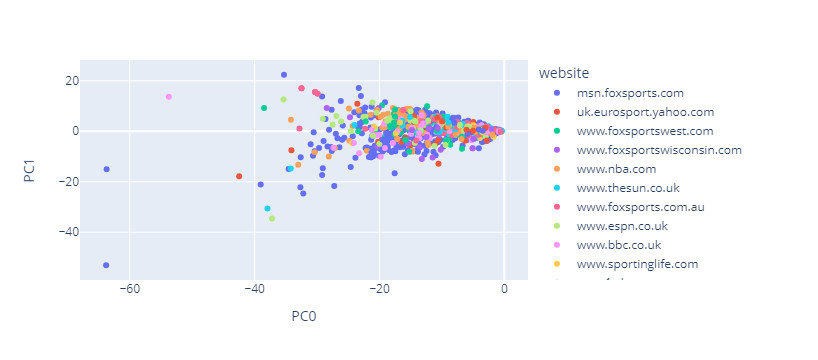

In [72]:
vis_pcs(DCM, 0, 1)

The scatterplot above maps the first principal component derived from our corpus' document-term matrix against the second principal component. As mentioned previously, there is unfortunately a limited scope of analysis of this corpus due to a lack of metadata beyond article URL and website, and a severe class imbalance among websites as well. As such, the most useful insights gleaned from PCA may come in the form of visual outlier analysis. Interestingly, each of the three most notable outliers directly above are easily some of the longest articles in this set of texts. As such, it could be argued that each of the first two principal components are picking up some form of writing and word choice that varies between long-form, story-like articles and much shorter, summary-style sports reports. As futher evidence of this, the article with the lowest PC values on both axes is an extremely succinct news blurb of only three sentences in length ("Text0080", for reference).

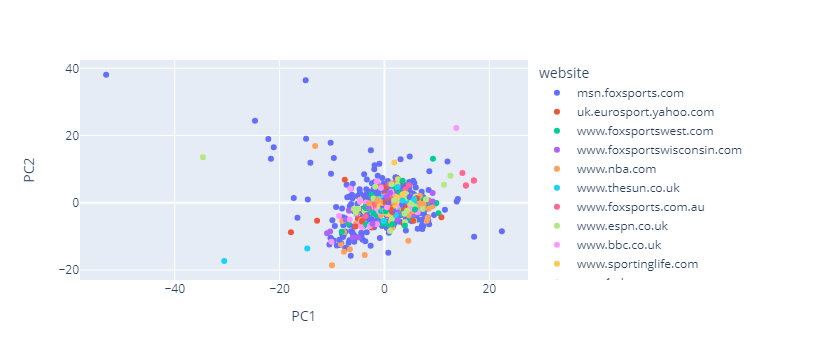

In [73]:
vis_pcs(DCM, 1, 2)

The next plot above maps the second principal component against the third principal component. The slight reduction in apparent outliers (in terms of magnitude) compared to the plot including the first principal component calls more attention to examining the second principal component. Interestingly, there does appear to be an apparent difference between the articles with high positive "PC1" values and high negative "PC1" values just by looking at the URL's. The leftmost observation on the plot, as indicated by the string inside the URL, is a preview of teams likely to compete for Super Bowl XLVII. The next leftmost observations are articles detailing fantasy football evaluation of rookie players, women's basketball game recaps, and a power ranking of NFL teams, as gleaned by their URL's. Conversely, some of the rightmost observations on the plot include articles about a boxer surviving cancer, Lance Armstrong's admitting to doping, and a discussion of openly gay baseball players. As such, it could be argued that the second principal component is picking up on the spectrum of actual sports-related conversation opposed to more generalizable, narrative-based storied which just happen to be within the sports sphere.

In [74]:
COMPS.to_csv('COMPS.csv')
DCM.to_csv('DCM.csv')
LOADINGS.to_csv('LOADINGS.csv')

## Latent Dirichlet Allocation
#### Code Adapted from Module 8 Notebook.

In [75]:
n_topics = 20
max_iter = 5

The number of topics on which to model this corpus was a matter of trial-and-error; the code in this subsection was run multiple times with different values of `n_topics` above; 20 was chosen as the number of topics primarily due to the balance of being able to broaden the potential diversity of topics as opposed to a lower number, while also being able to easily visually represent topics via the hierarchical cluster diagram below.

In [76]:
PARAS = TOKEN[TOKEN.pos.str.match(r'^NNS?$')]\
    .groupby(OHCO[:2]).term_str\
    .apply(lambda x: ' '.join(x))\
    .to_frame()\
    .rename(columns={'term_str':'para_str'})

In [77]:
tfv = CountVectorizer()
tf = tfv.fit_transform(PARAS.para_str)
TERMS = tfv.get_feature_names()

In [78]:
lda = LDA(n_components=n_topics, max_iter=5, learning_offset=50., random_state=0)

In [79]:
THETA = pd.DataFrame(lda.fit_transform(tf), index=PARAS.index)
THETA.columns.name = 'topic_id'
THETA.sample(20).style.background_gradient()

,topic_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
article_id,para_num,,,,,,,,,,,,,,,,,,,,
Text0967,8,0.005556,0.005556,0.005556,0.005556,0.005556,0.005556,0.005556,0.005556,0.005556,0.005556,0.005556,0.005556,0.894444,0.005556,0.005556,0.005556,0.005556,0.005556,0.005556,0.005556
Text0533,0,0.000735,0.424601,0.000735,0.270588,0.283596,0.000735,0.009449,0.000735,0.000735,0.000735,0.000735,0.000735,0.000735,0.000735,0.000735,0.000735,0.000735,0.000735,0.000735,0.000735
Text0042,0,0.000617,0.000617,0.000617,0.000617,0.000617,0.432016,0.000617,0.516485,0.000617,0.000617,0.000617,0.000617,0.000617,0.000617,0.000617,0.000617,0.000617,0.041005,0.000617,0.000617
Text0874,14,0.016667,0.016667,0.016667,0.387986,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667,0.312014,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667
Text0791,1,0.004167,0.004167,0.004167,0.004167,0.004167,0.004167,0.004167,0.309439,0.004167,0.615561,0.004167,0.004167,0.004167,0.004167,0.004167,0.004167,0.004167,0.004167,0.004167,0.004167
Text0926,12,0.002000,0.002000,0.002000,0.002000,0.002000,0.002000,0.002000,0.591192,0.002000,0.002000,0.002000,0.002000,0.002000,0.372808,0.002000,0.002000,0.002000,0.002000,0.002000,0.002000
Text0778,4,0.025000,0.025000,0.025000,0.025000,0.525000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000,0.025000
Text0973,20,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.881250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250
Text0822,12,0.016667,0.016667,0.016667,0.016667,0.016667,0.683333,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667,0.016667


In [80]:
PHI = pd.DataFrame(lda.components_, columns=TERMS)
PHI.index.name = 'topic_id'
PHI.columns.name  = 'term_str'
PHI.T.head().style.background_gradient()

topic_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
term_str,,,,,,,,,,,,,,,,,,,,
01,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,2.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000
03,0.050000,0.050000,0.050000,0.050000,0.050000,0.088000,2.012000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000
06,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,2.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000
07,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,1.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000
08,0.050000,0.050000,0.050000,2.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000


In [81]:
TOPICS = PHI.stack().to_frame().rename(columns={0:'weight'})\
    .groupby('topic_id')\
    .apply(lambda x: 
           x.weight.sort_values(ascending=False)\
               .head(20)\
               .reset_index()\
               .drop('topic_id',1)\
               .term_str)
TOPICS

term_str,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
topic_id,,,,,,,,,,,,,,,,,,,,
0,game,football,coach,field,team,season,players,chance,fans,quarterback,goal,player,said,time,people,end,way,teams,league,defense
1,game,points,games,team,season,time,point,rebounds,said,quarter,lot,minutes,assists,night,half,yards,league,win,ball,shots
2,players,time,round,game,team,year,match,way,said,club,lot,week,years,player,family,times,par,victory,football,days
3,season,year,team,games,time,points,league,players,teams,record,game,goals,career,victory,years,win,seasons,playoff,clubs,side
4,season,players,team,games,gold,game,years,time,way,race,medal,year,program,court,player,suspension,saints,coach,field,teams
5,team,point,year,season,guard,game,said,players,player,time,way,coach,league,years,games,guys,deal,week,play,one
6,team,game,said,time,seconds,goal,half,season,way,lead,points,play,end,year,minutes,championship,run,victory,ball,win
7,season,year,players,years,games,game,home,player,career,runs,team,seasons,base,end,manager,writer,league,line,round,quarterback
8,car,team,said,players,sports,player,people,world,years,year,things,time,sport,blood,report,man,thing,fan,driver,lot


In [82]:
TOPICS['label'] = TOPICS.apply(lambda x: str(x.name) + ' ' + ' '.join(x), 1)

In [83]:
THETA = THETA.reset_index().merge(LIB, on = 'article_id', how="left").set_index(THETA.index.names)

In [84]:
topic_cols = [t for t in range(n_topics)]
WEBSITES = THETA.groupby('website')[topic_cols].mean().T                                            
WEBSITES.index.name = 'topic_id'
WEBSITES['topterms'] = TOPICS[[i for i in range(15)]].apply(lambda x: ' '.join(x), 1)
WEBSITES.sort_values('msn.foxsports.com', ascending=False).style.background_gradient()

website,allball.blogs.nba.com,aol.sportingnews.com,articles.latimes.com,auto-racing.speedtv.com,azstarnet.com,beardedwordslinger.wordpress.com,bet.unibet.com,blogs.bulls.com,blogs.telegraph.co.uk,dailystar.com.lb,edition.cnn.com,espn.go.com,formula-one.speedtv.com,foxsportsfantasybuzz.yardbarker.com,hangtime.blogs.nba.com,manutd.theoffside.com,metro.co.uk,moto-racing.speedtv.com,motorcycling.speedtv.com,msn.foxsports.com,network.yardbarker.com,nmsn.foxsports.com,sportsillustrated.cnn.com,sportsrighting.com,tennisjournalist.blogspot.com,thecommentaryboxblog.wordpress.com,thefarmclub.net,tribune.com.pk,uk.eurosport.yahoo.com,uk.reuters.com,urbantennis.wordpress.com,vigilantebaseball.com,web.orange.co.uk,worldsport.blogs.cnn.com,www.athleticka.net,www.bbc.co.uk,www.caribjournal.com,www.chicagotribune.com,www.dailymail.co.uk,www.dailystar.co.uk,www.espn.co.uk,www.football365.com,www.foxsports.com.au,www.foxsportsarizona.com,www.foxsportscarolinas.com,www.foxsportsdetroit.com,www.foxsportsflorida.com,www.foxsportskansascity.com,www.foxsportsmidwest.com,www.foxsportsnorth.com,www.foxsportsohio.com,www.foxsportssouth.com,www.foxsportssouthwest.com,www.foxsportstennessee.com,www.foxsportswest.com,www.foxsportswisconsin.com,www.grantland.com,www.guardian.co.uk,www.herald.ie,www.hoganstand.com,www.huffingtonpost.com,www.independent.co.uk,www.lutontoday.co.uk,www.masslive.com,www.montereyherald.com,www.nba.com,www.nytimes.com,www.rantsports.com,www.rbs6nations.com,www.sbs.com.au,www.skysports.com,www.somersetcountygazette.co.uk,www.sport24.co.za,www.sportinglife.com,www.suntimes.com,www.swishappeal.com,www.talksport.co.uk,www.tennis.com,www.thesun.co.uk,www.und.com,www.walesonline.co.uk,www.wnba.com,www.yardbarker.com,www1.skysports.com,topterms
topic_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.187709,0.001471,0.527673,0.008115,0.201105,0.000595,0.000877,0.368866,0.000428,0.340934,0.023776,0.235431,0.000660,0.001563,0.312222,0.001890,0.003542,0.001064,0.000417,0.084607,0.112729,0.105889,0.001287,0.063860,0.003709,0.000549,0.212805,0.000962,0.007139,0.000279,0.005633,0.104170,0.005265,0.000510,0.001786,0.004135,0.377193,0.245710,0.066180,0.035618,0.000675,0.033421,0.124299,0.336089,0.581705,0.221267,0.142031,0.176935,0.007894,0.124718,0.132461,0.090655,0.127586,0.058093,0.125686,0.132527,0.485305,0.020778,0.009375,0.002500,0.000490,0.008333,0.001250,0.001000,0.000575,0.375939,0.090740,0.004559,0.000877,0.000350,0.024578,0.095181,0.002371,0.058377,0.910251,0.195576,0.001563,0.055624,0.012017,0.778135,0.034491,0.122854,0.005313,0.000943,game points games team season time point rebounds said quarter lot minutes assists night half
7,0.006534,0.001471,0.016478,0.008115,0.000704,0.000595,0.000877,0.008042,0.000428,0.003499,0.004940,0.017379,0.000660,0.316906,0.323301,0.113427,0.003542,0.001064,0.000417,0.079425,0.099173,0.067310,0.001287,0.473541,0.003709,0.000549,0.000216,0.000962,0.041471,0.746167,0.011049,0.478971,0.005265,0.148875,0.147596,0.034656,0.000676,0.013139,0.006477,0.028234,0.025182,0.045457,0.002284,0.012936,0.000338,0.059719,0.036421,0.016834,0.143822,0.021561,0.050061,0.055515,0.041782,0.044480,0.044932,0.077222,0.000235,0.064239,0.009375,0.002500,0.135203,0.008333,0.001250,0.001000,0.000575,0.037048,0.008630,0.004559,0.000877,0.000350,0.062126,0.008853,0.002371,0.019285,0.000368,0.064587,0.001563,0.007209,0.012017,0.003733,0.048520,0.034804,0.005313,0.859295,season year players years games game home player career runs team seasons base end manager
3,0.006534,0.001471,0.002313,0.166273,0.000704,0.000595,0.000877,0.072231,0.000428,0.040400,0.107885,0.059952,0.118316,0.001563,0.000615,0.001890,0.003542,0.001064,0.000417,0.079013,0.074491,0.001150,0.001287,0.051569,0.003709,0.000549,0.000216,0.620134,0.085026,0.248805,0.126668,0.174105,0.005265,0.215513,0.001786,0.063264,0.000676,0.123754,0.081385,0.098001,0.000675,0.074545,0.002284,0.071743,0.000338,0.147032,0.120571,0.012097,0.0321

In [85]:
TOPICS.to_csv('TOPICS.csv')

In [86]:
def plot_tree(tree, labels):
    plt.figure()
    fig, axes = plt.subplots(figsize=(5, 10))
    dendrogram = sch.dendrogram(tree, labels=labels, orientation="left")
    plt.tick_params(axis='both', which='major', labelsize=14)

In [87]:
SIMS = pdist(normalize(PHI), metric='euclidean')
TREE = sch.linkage(SIMS, method='ward')

In [88]:
labels  = ["{}: {}".format(a,b) for a, b in zip(WEBSITES.index, WEBSITES.topterms.tolist())]

<Figure size 640x480 with 0 Axes>

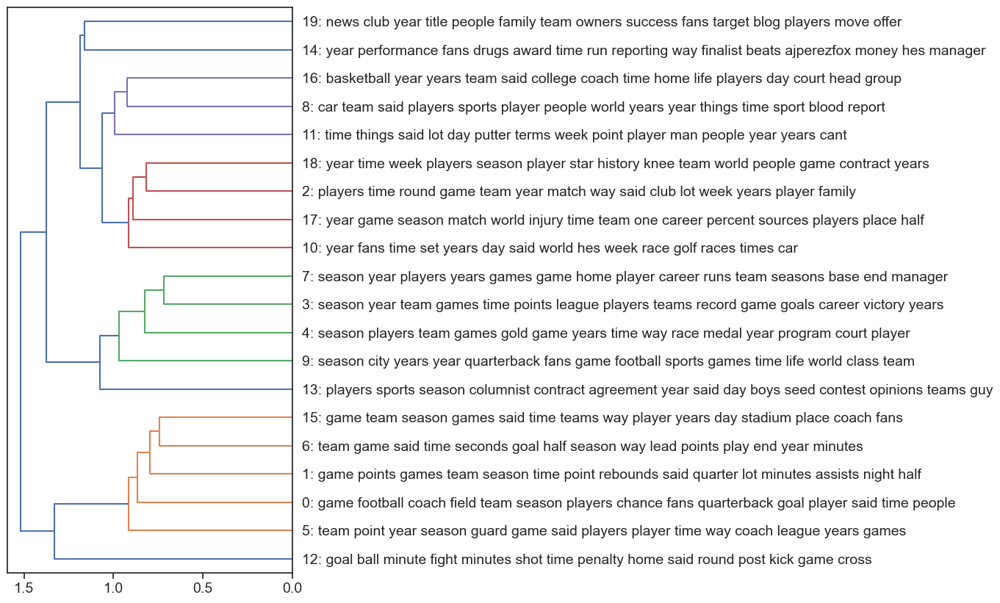

In [89]:
plot_tree(TREE, labels)

Although there are some terms above grouped together logically, it does not appear as if the Latent Dirichlet Allocation attempt has gleaned notable, distinct topics from our corpus of text. Rather, there is a noticeable overlap between topics; given that this entire corpus of text is only within the domain of sports, it could be argued that this is to be expected. The LDA was still able to find some similarities between words one would expect, such as "basketball" and "court" both appearing Topic 16, but it is hard to glean very apparent insights from the topics as they are clustered above. That said, there are a few interesting observations to point out. For example, the topics furthest apart from each other on the graph seem to offer comparatively positive and negative sentiments; Topic 19 contains the words "title" and "success," while Topic 12 contains "fight," "penalty," and "home" (potentially as in the phrase "going home" after a team is eliminated)

## Word Embeddings
#### Code Adapted from Module 9 Notebook.

In this section, t-SNE plots are analyzed for both the entire corpus and a selection of some of the websites which were most commonly found across the 1,000 articles.

### Entire Corpus

In [90]:
corpus = TOKEN[~TOKEN.pos.str.match('NNPS?')]\
    .groupby(OHCO[:2])\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [91]:
model = word2vec.Word2Vec(corpus, vector_size=246, min_count = 75, window=5, workers=4)

The `min_count` value above was decided for each iteration of the word2vec model based on trial-and-error by observing the outputted t-SNE plot and ensuring both relative ease of interpretability and a sufficient number of included terms.

In [92]:
coords = pd.DataFrame(index=range(len(model.wv.key_to_index)))
coords['label'] = [w for w in model.wv.key_to_index]
coords['vector'] = coords['label'].apply(lambda x: model.wv.get_vector(x))

In [93]:
tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=42)
tsne_values = tsne_model.fit_transform(coords['vector'].tolist())

In [94]:
coords['x'] = tsne_values[:,0]
coords['y'] = tsne_values[:,1]
coords.head()

,label,vector,x,y
0,said,"[-0.02351567, -0.06057713, -0.0009374188, 0.10...",-39.773014,3.112289
1,game,"[-0.12096404, -0.16598023, -0.04179526, 0.1030...",14.759034,-6.816833
2,season,"[-0.026485655, -0.09633848, -0.12248429, 0.103...",28.234400,-9.639986
3,one,"[-0.05060724, -0.06419839, -0.071100235, 0.043...",-4.519139,6.367782
4,team,"[0.0054957448, -0.077657335, -0.05001185, 0.05...",-6.315745,8.825215


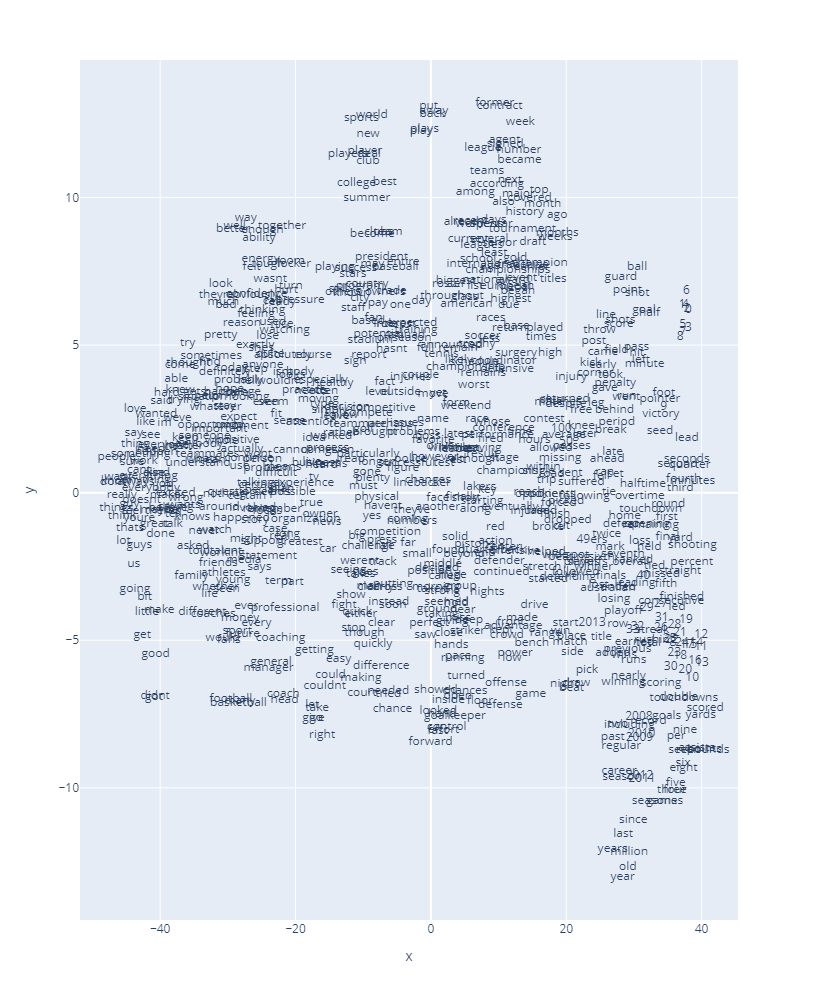

In [95]:
px.scatter(coords, 'x', 'y', text='label', height=1000).update_traces(mode='text')

T-SNE at the entire corpus level has some unsurprising clusters of terms. For example, single-digit and teen numbers are alone in the top-right of the plot, while certain words associated with authoritative positions within sports (e.g., "general," "manager," "head," "coach") are clustered tightly towards the bottom-left of the plot. Other apparent clusters made by the t-SNE model include game timing (right-most side of plot where y is approximately zero) including "halftime," "overtime," "seconds," and "quarters" close to one another, as well as contract-related terms at the very top of the plot (i.e., "contract," "agent," signed").

In [96]:
coords.to_csv('EMBEDDINGS.csv')

### Fox Sports

In [97]:
corpus_fox = TOKEN[TOKEN.website.str.contains('msn.foxsports.com')][~TOKEN.pos.str.match('NNPS?')]\
    .groupby(OHCO[:2])\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

C:\Users\nvcjr\AppData\Local\Temp\ipykernel_16644\1466396101.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [98]:
model_fox = word2vec.Word2Vec(corpus_fox, vector_size=246, min_count = 50, window=5, workers=4)

In [99]:
coords_fox = pd.DataFrame(index=range(len(model_fox.wv.key_to_index)))
coords_fox['label'] = [w for w in model_fox.wv.key_to_index]
coords_fox['vector'] = coords_fox['label'].apply(lambda x: model_fox.wv.get_vector(x))

In [100]:
tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=42)
tsne_values_fox = tsne_model.fit_transform(coords_fox['vector'].tolist())

In [101]:
coords_fox['x'] = tsne_values_fox[:,0]
coords_fox['y'] = tsne_values_fox[:,1]

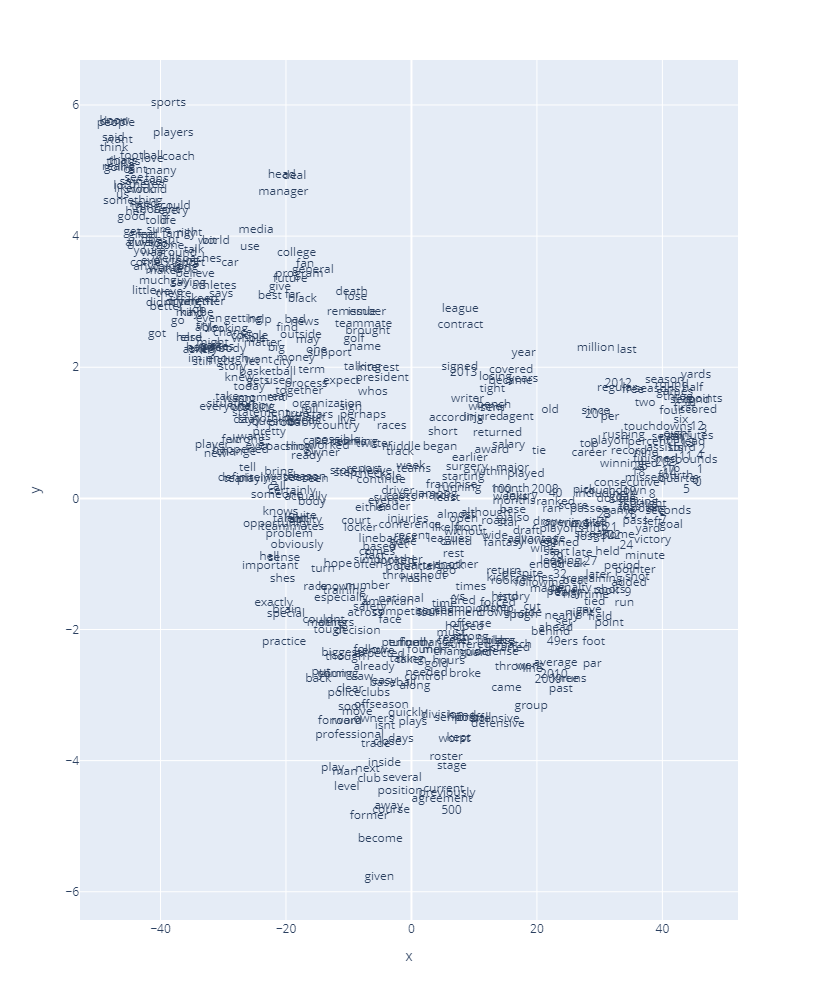

In [102]:
px.scatter(coords_fox, 'x', 'y', text='label', height=1000).update_traces(mode='text')

Analyzing the t-SNE plot shows how the model decides to cluster certain terms, but nothing seems particularly noteworthy compared to analysis of the entire corpus. Words such as "signed," "contract," "year," and "million" remain close to one another, for example.

In [109]:
corpus_eurosport = TOKEN[TOKEN.website.str.contains('uk.eurosport.yahoo.com')][~TOKEN.pos.str.match('NNPS?')]\
    .groupby(OHCO[:2])\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

C:\Users\nvcjr\AppData\Local\Temp\ipykernel_16644\3770180854.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [110]:
model_eurosport = word2vec.Word2Vec(corpus_eurosport, vector_size=246, window=5, workers=4)

In [111]:
coords_eurosport = pd.DataFrame(index=range(len(model_eurosport.wv.key_to_index)))
coords_eurosport['label'] = [w for w in model_eurosport.wv.key_to_index]
coords_eurosport['vector'] = coords_eurosport['label'].apply(lambda x: model_eurosport.wv.get_vector(x))

In [112]:
tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=42)
tsne_values_eurosport = tsne_model.fit_transform(coords_eurosport['vector'].tolist())

In [113]:
coords_eurosport['x'] = tsne_values_eurosport[:,0]
coords_eurosport['y'] = tsne_values_eurosport[:,1]

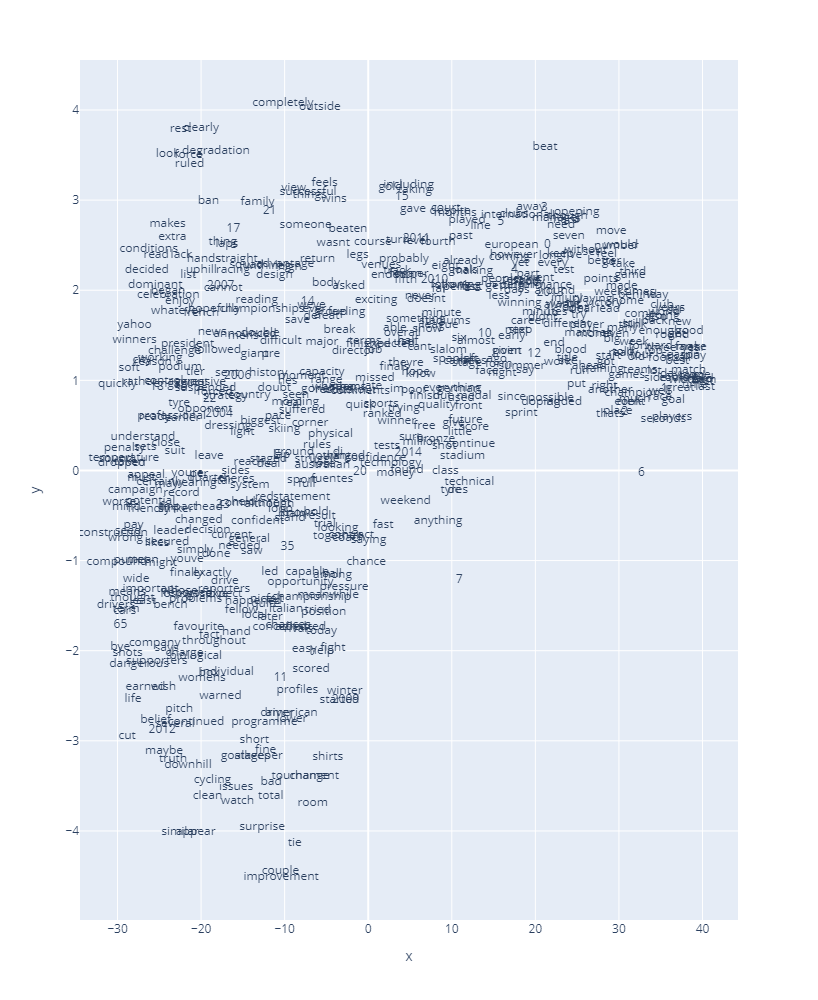

In [114]:
px.scatter(coords_eurosport, 'x', 'y', text='label', height=1000).update_traces(mode='text')

The most notable thing about the t-SNE plot above for Eurosport articles, as well as those for CNN and BBC articles below, is the comparative dearth of terms, even with no `min_count` within the word2vec model. Ultimately, this speaks to the severe class imbalance of websites within the original dataset, combined with a lack of other categories on which to analyze the data.

In [115]:
corpus_cnn = TOKEN[TOKEN.website.str.contains('cnn')][~TOKEN.pos.str.match('NNPS?')]\
    .groupby(OHCO[:2])\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

C:\Users\nvcjr\AppData\Local\Temp\ipykernel_16644\1207377958.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [116]:
model_cnn = word2vec.Word2Vec(corpus_cnn, vector_size=246, window=5, workers=4)

In [117]:
coords_cnn = pd.DataFrame(index=range(len(model_cnn.wv.key_to_index)))
coords_cnn['label'] = [w for w in model_cnn.wv.key_to_index]
coords_cnn['vector'] = coords_cnn['label'].apply(lambda x: model_cnn.wv.get_vector(x))

In [118]:
tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=42)
tsne_values_cnn = tsne_model.fit_transform(coords_cnn['vector'].tolist())

In [119]:
coords_cnn['x'] = tsne_values_cnn[:,0]
coords_cnn['y'] = tsne_values_cnn[:,1]

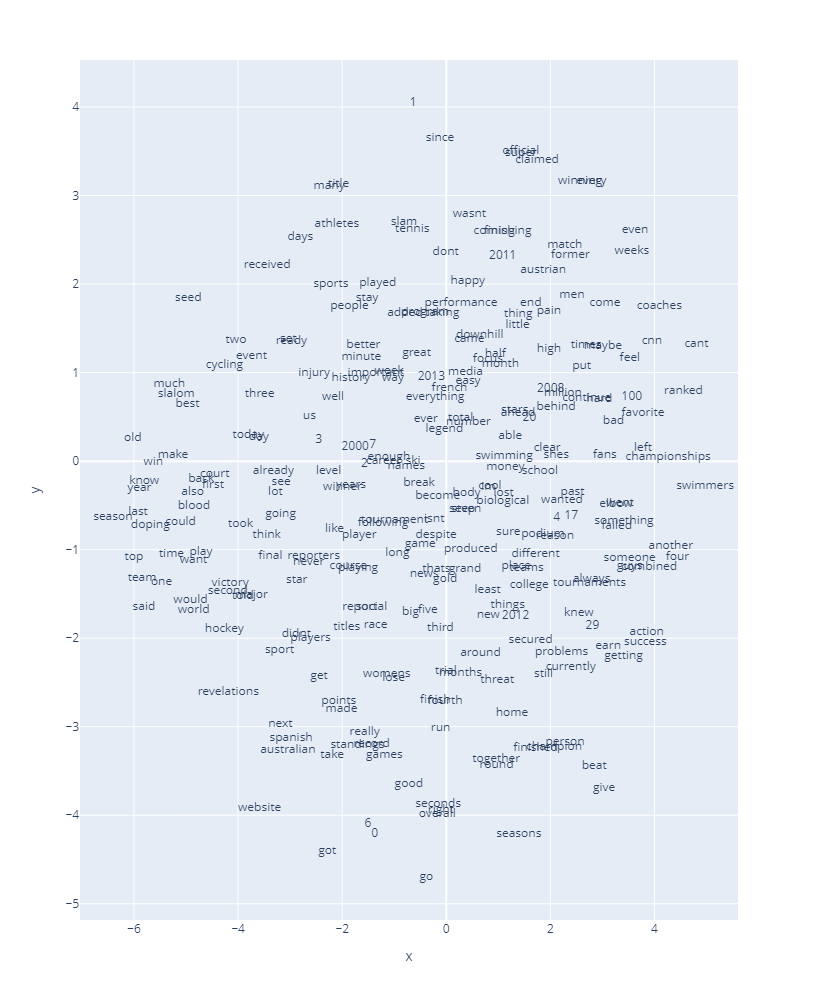

In [120]:
px.scatter(coords_cnn, 'x', 'y', text='label', height=1000).update_traces(mode='text')

In [121]:
corpus_bbc = TOKEN[TOKEN.website.str.contains('bbc')][~TOKEN.pos.str.match('NNPS?')]\
    .groupby(OHCO[:2])\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

C:\Users\nvcjr\AppData\Local\Temp\ipykernel_16644\2083156285.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [122]:
model_bbc = word2vec.Word2Vec(corpus_bbc, vector_size=246, window=5, workers=4)

In [123]:
coords_bbc = pd.DataFrame(index=range(len(model_bbc.wv.key_to_index)))
coords_bbc['label'] = [w for w in model_bbc.wv.key_to_index]
coords_bbc['vector'] = coords_bbc['label'].apply(lambda x: model_bbc.wv.get_vector(x))

In [124]:
tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=42)
tsne_values_bbc = tsne_model.fit_transform(coords_bbc['vector'].tolist())

In [125]:
coords_bbc['x'] = tsne_values_bbc[:,0]
coords_bbc['y'] = tsne_values_bbc[:,1]

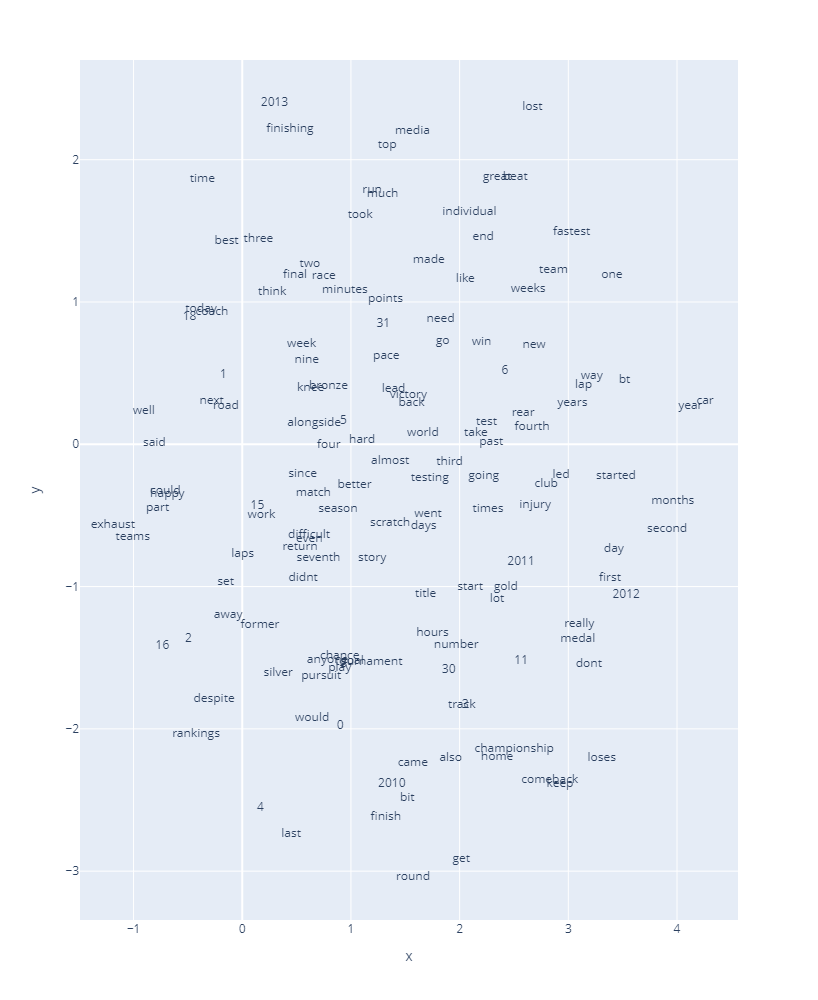

In [126]:
px.scatter(coords_bbc, 'x', 'y', text='label', height=1000).update_traces(mode='text')

## Sentiment Analysis
#### Code adapted from Module 10 notebook.

In [127]:
salex_csv = 'salex_nrc.csv'
nrc_cols = "nrc_negative nrc_positive nrc_anger nrc_anticipation nrc_disgust nrc_fear nrc_joy nrc_sadness nrc_surprise nrc_trust".split()
emo = 'polarity'

In [128]:
salex = pd.read_csv(salex_csv).set_index('term_str')
salex.columns = [col.replace('nrc_','') for col in salex.columns]
salex['polarity'] = salex.positive - salex.negative

In [129]:
emo_cols = "anger anticipation disgust fear joy sadness surprise trust polarity".split()

In [130]:
TOKEN = TOKEN.join(salex, on='term_str', how='left')
TOKEN = TOKEN.reset_index().merge(LIB['website'], on = 'article_id', how="inner").set_index(TOKEN.index.names)
TOKEN[emo_cols] = TOKEN[emo_cols].fillna(0)

In [131]:
TOKEN = TOKEN.rename(columns = {'website_x': 'website'})
TOKEN = TOKEN.drop(columns=['website_y'])
TOKEN[['term_str'] + emo_cols].sample(10)

,,,,term_str,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
article_id,para_num,sent_num,token_num,,,,,,,,,,
Text0118,0,4,2,future,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0810,0,19,15,games,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0385,8,1,0,get,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0406,0,8,0,ive,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0558,8,0,8,suspension,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0
Text0737,3,9,46,east,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0794,0,27,10,80s,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0743,3,8,13,defensive,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Text0494,4,1,6,million,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [132]:
TOKEN.to_csv('SENTIMENTS.csv')

In [133]:
FOX = TOKEN.loc[TOKEN['website'] == 'msn.foxsports.com'].copy()
EUROSPORT = TOKEN.loc[TOKEN['website'] == 'uk.eurosport.yahoo.com'].copy()
CNN = TOKEN.loc[TOKEN['website'] == 'edition.cnn.com'].copy()
BBC = TOKEN.loc[TOKEN['website'] == 'www.bbc.co.uk'].copy()
#https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.loc.html

<AxesSubplot:title={'center':'Entire Corpus'}>

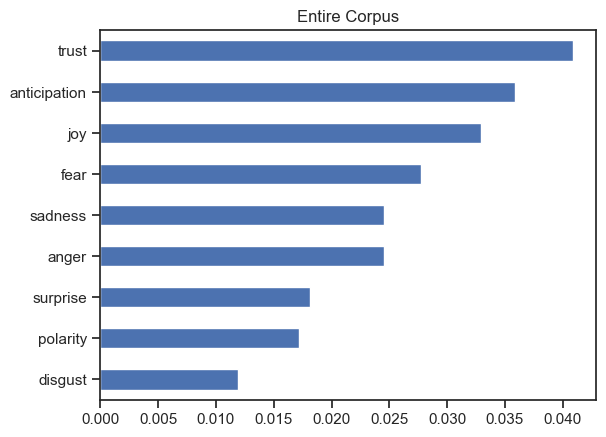

In [154]:
TOKEN[emo_cols].mean().sort_values().plot.barh(title="Entire Corpus")

<AxesSubplot:title={'center':'Fox Sports'}>

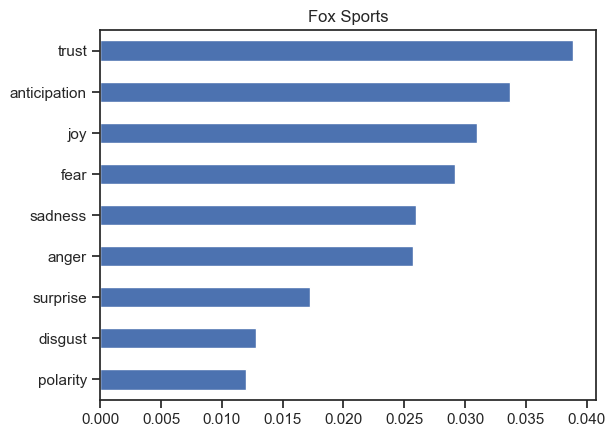

In [155]:
FOX[emo_cols].mean().sort_values().plot.barh(title="Fox Sports")

Unsurprisingly, the sentiments within Fox Sports' set of articles is nearly identical to those sentiments of the entire corpus, in terms of both the ranking of emotions and their relative strengths. After all, Fox Sports comprises nearly half of the articles in the corpus, and this visualization once again speaks to that class imbalance.

<AxesSubplot:title={'center':'Eurosport'}>

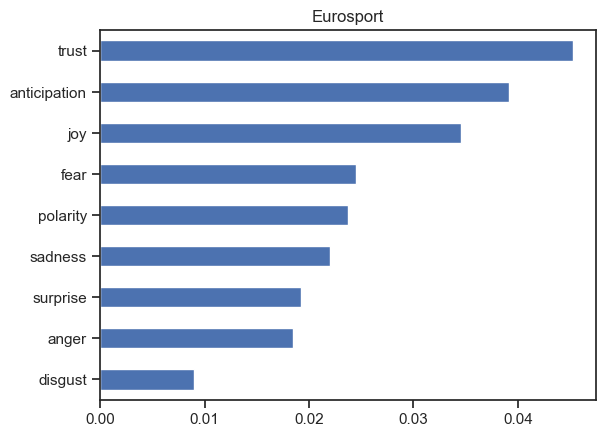

In [156]:
EUROSPORT[emo_cols].mean().sort_values().plot.barh(title="Eurosport")

<AxesSubplot:title={'center':'CNN'}>

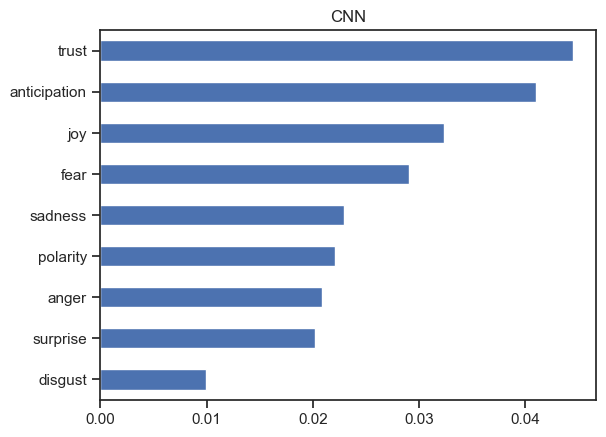

In [157]:
CNN[emo_cols].mean().sort_values().plot.barh(title="CNN")

<AxesSubplot:title={'center':'BBC'}>

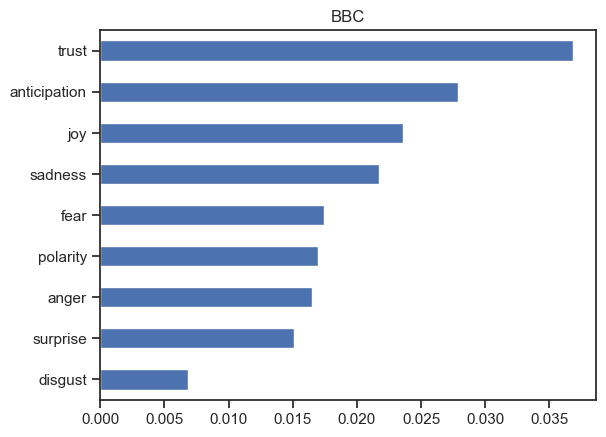

In [158]:
BBC[emo_cols].mean().sort_values().plot.barh(title="BBC")

The only notable difference between the sentiments of the entire corpus and Fox Sports compared to those of Eurosport, CNN, and BBC is the prevalence and strength of polarity. It is one of the least prevalent of the nine emotions within the entire corpus and that of Fox Sports, but much closer to median prevalence within the other subsets observed. That said, essentially all other sentiments remain identical across the subsets analyzed.

In [138]:
FOX['html'] = FOX.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)
EUROSPORT['html'] = EUROSPORT.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)
CNN['html'] = CNN.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)
BBC['html'] = BBC.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)

In [139]:
FOX_sents = FOX.groupby(OHCO[0:3])[emo_cols].mean()
EUROSPORT_sents = EUROSPORT.groupby(OHCO[0:3])[emo_cols].mean()
CNN_sents = CNN.groupby(OHCO[0:3])[emo_cols].mean()
BBC_sents = BBC.groupby(OHCO[0:3])[emo_cols].mean()

In [140]:
FOX_sents['sent_str'] = FOX.groupby(OHCO[0:3]).term_str.apply(lambda x: x.str.cat(sep=' '))
FOX_sents['html_str'] = FOX.groupby(OHCO[0:3]).html.apply(lambda x: x.str.cat(sep=' '))
EUROSPORT_sents['sent_str'] = EUROSPORT.groupby(OHCO[0:3]).term_str.apply(lambda x: x.str.cat(sep=' '))
EUROSPORT_sents['html_str'] = EUROSPORT.groupby(OHCO[0:3]).html.apply(lambda x: x.str.cat(sep=' '))
CNN_sents['sent_str'] = CNN.groupby(OHCO[0:3]).term_str.apply(lambda x: x.str.cat(sep=' '))
CNN_sents['html_str'] = CNN.groupby(OHCO[0:3]).html.apply(lambda x: x.str.cat(sep=' '))
BBC_sents['sent_str'] = BBC.groupby(OHCO[0:3]).term_str.apply(lambda x: x.str.cat(sep=' '))
BBC_sents['html_str'] = BBC.groupby(OHCO[0:3]).html.apply(lambda x: x.str.cat(sep=' '))

In [141]:
def sample_sentences(df):
    rows = []
    for idx in df.sample(10).index:

        valence = round(df.loc[idx, emo], 4)     
        t = 0
        if valence > t: color = '#ccffcc'
        elif valence < t: color = '#ffcccc'
        else: color = '#f2f2f2'
        z=0
        rows.append("""<tr style="background-color:{0};padding:.5rem 1rem;font-size:110%;">
        <td>{1}</td><td>{3}</td><td width="400" style="text-align:left;">{2}</td>
        </tr>""".format(color, valence, df.loc[idx, 'html_str'], idx))

    display(HTML('<style>#sample1 td{font-size:120%;vertical-align:top;} .sent-1{color:red;font-weight:bold;} .sent1{color:green;font-weight:bold;}</style>'))
    display(HTML('<table id="sample1"><tr><th>Sentiment</th><th>ID</th><th width="600">Sentence</th></tr>'+''.join(rows)+'</table>'))

In [142]:
sample_sentences(FOX_sents)

Sentiment,ID,Sentence
0.0,"('Text0345', 1, 14)","Tristan Thompson 18 points 11 rebounds Cleveland, Dion Waiters also scored 18 points."
0.0,"('Text0377', 0, 0)","FIFA says use goal line technology 2014 World Cup Brazil, could four systems competing selection."
-0.0833,"('Text0252', 1, 9)","Bisping, 33, recently primed breakthrough last January, lost unanimous decision Chael Sonnen."
0.0667,"('Text0474', 0, 13)","free skate rout jump fourth first, finished 255 points overall, almost four better Ross Miner."
0.0,"('Text0666', 1, 0)",2013 NASCAR Sprint Cup models unveiled headed tests soon.
0.5,"('Text0591', 0, 4)",incredible feeling winning trophy
-0.2857,"('Text0749', 4, 9)",Seau first last player kill rash suicides.
0.0,"('Text0094', 2, 9)",1 Miami’s Jake Long 2008.
-0.1111,"('Text0595', 2, 5)",shot bounced pads deflected back Dan Boyle's skates net.
0.0,"('Text0995', 9, 14)",position


In [143]:
sample_sentences(EUROSPORT_sents)

Sentiment,ID,Sentence
0.0,"('Text0484', 0, 1)","Rosberg, whose morning disrupted lengthy gearbox checks, first make move."
0.25,"('Text0892', 0, 97)",knows important player hands.
-0.0833,"('Text0875', 0, 7)","Put simply, across range year’s tyres faster easier make work wear quicker."
0.0,"('Text0388', 0, 2)","City supporters camped overnight snow last week outside Valley Parade snap last remaining tickets almost 32,000 converge Wembley celebrate Phil Parkinson's npower League Two side bid fulfill impossible dream."
0.0526,"('Text0875', 0, 1)",Last year’s tyres put cars knife edge beginning season teams struggled understand best manage narrow working temperature track track.
0.0,"('Text0817', 0, 7)",FIA concern believed use bodywork behind exhaust exits harnesses gases aerodynamic advantage.
0.0,"('Text0649', 0, 17)","definitely going right direction."""
0.2,"('Text0948', 0, 27)",honestly haven't even thought winning
0.0,"('Text0351', 0, 53)",conceded seven goals 22 Bundesliga games.
0.0,"('Text0787', 0, 32)",Everything


In [144]:
sample_sentences(CNN_sents)

Sentiment,ID,Sentence
0.0,"('Text0946', 0, 11)","Yet man heads world's top anti doping body, revelations move right direction, rather proof failure."
-0.0667,"('Text0586', 1, 1)","despite nowhere near optimum fitness, Henin also admitted holder Williams' absence throws tournament wide open."
0.04,"('Text0956', 2, 19)","time Jim belts national anthem Canada's) times pump volume ""Chelsea Dagger"" celebrate Blackhawk goal, home game United Center usually loud, usually usually bigger rolled one."
0.0,"('Text0058', 1, 19)",Swedish fourth seed Robin Soderling British
0.3333,"('Text0956', 2, 28)",I'm enjoying much.
0.3529,"('Text0224', 5, 1)","""Swimming proud history country everyone sport wants maintain improve credibility integrity developed century success,"" said president Barclay"
0.0,"('Text0043', 4, 15)",didn't want show play.
0.0,"('Text0371', 0, 15)","serious,"" Peter Fischer, head organizing committee Garmisch Partenkirchen told reporters."
0.0,"('Text0226', 0, 4)","Errani, No.5 seed Sara, disposed Russia's Nadia Petrova 6 4 0 6 6 3 set clash bring forward mixed emotions players."
0.0385,"('Text0946', 0, 1)",current fatigue drug revelations sport appearance trial Operation Puerto scandal Spanish doctor Eufemiano Fuentes accused masterminding blood doping network highest level professional cycling met little collective


In [160]:
sample_sentences(BBC_sents)

Sentiment,ID,Sentence
0.0,"('Text0686', 1, 14)",option represent Great Britain chose ride Ireland.
0.5,"('Text0686', 3, 4)","level commitment."""
0.0,"('Text0127', 1, 16)","Poulter pressed home lead beat Scotland's Dubai Desert Classic winner Stephen Gallacher 2&1, Rose downed South Korea's KJ Choi 2&1 Donald claimed birdie last beat German Marcel Siem."
0.0,"('Text0395', 0, 0)",Reds recovered three goal deficit tie miss away goals rousing comeback.
-0.012,"('Text0426', 0, 5)",Nadal injury timeline 28 June 2012: Nadal loses Lukas Rosol second round Wimbledon 14 July: Pulls exhibition match Novak Djokovic tendonitis 19 July: Withdraws Olympics tendonitis left knee 15 August: Withdraws US Open 3 September: Announces partially torn patella tendon 25 October: Confirms play Paris Masters ATP World Tour Finals 25 December: Pulls Abu Dhabi exhibition stomach virus 28 December: Withdraws Australian Open virus 5 February 2013: Nadal returns alongside Juan Monaco Vina del Mar doubles playing first singles match 24 hours later
0.0,"('Text0253', 2, 3)","""That's main motivation think keep Mouratoglou said."
0.0,"('Text0686', 3, 2)",work road use world championship track Palma.
-0.0909,"('Text0282', 1, 2)",pulled managing 19 yards first kick kicked 13 yards second effort.
0.0,"('Text0645', 1, 18)","Last year's world championship runner decided skip first test two weeks ago concentrate physical mental preparation new season, starts Australia 17 March."
-0.0909,"('Text0686', 0, 10)",Balbriggan Cycling Club hold race name Harry Reynolds Memorial' every year.
